In [1]:
import pandas as pd
from functions import *

import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from imblearn.under_sampling import RandomUnderSampler

from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.cm as cm


In [2]:
data = pd.read_csv('cleanedData/data.csv')
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,TOTALAREA,CELLPHONE_ACCESS,CNT_DOCUMENTS,AMT_CREDIT_SUM,CNT_PAYMENT,CREDIT_DURATION,AMT_ANNUITY_y,AMT_CREDIT_y,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.094100,3,1,59293.652143,24.000000,19.353584,9251.775000,179055.00,Approved,New
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.128167,3,1,69133.500000,10.000000,8.677472,56553.990000,484191.00,Approved,Refreshed
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.200733,3,0,94518.900000,4.000000,3.753045,5357.250000,20106.00,Approved,New
3,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.200733,2,1,146250.000000,20.666667,12.644075,12278.805000,166638.75,Approved,Repeater
4,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,...,0.200733,3,1,100419.750000,14.000000,10.726940,15839.696250,162767.70,Approved,Repeater
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201018,456246,0,Cash loans,F,N,Y,1,94500.0,225000.0,10620.0,...,0.200733,2,1,127500.000000,3.000000,12.452183,6748.830000,84046.50,Approved,New
201019,456247,0,Cash loans,F,N,Y,0,112500.0,345510.0,17770.5,...,0.200733,2,1,119224.800000,7.750000,6.369956,10466.921250,59184.00,Approved,Repeater
201020,456249,0,Cash loans,F,N,Y,0,112500.0,225000.0,22050.0,...,0.496233,2,1,141979.808571,12.000000,9.671877,17133.952500,158699.25,Refused,Repeater
201021,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.132700,2,1,45000.000000,15.000000,11.160244,10681.132500,134439.75,Approved,Repeater


In [ ]:
data.DAYS_BIRTH

In [3]:
px.pie(data,names='TARGET')

<AxesSubplot:>

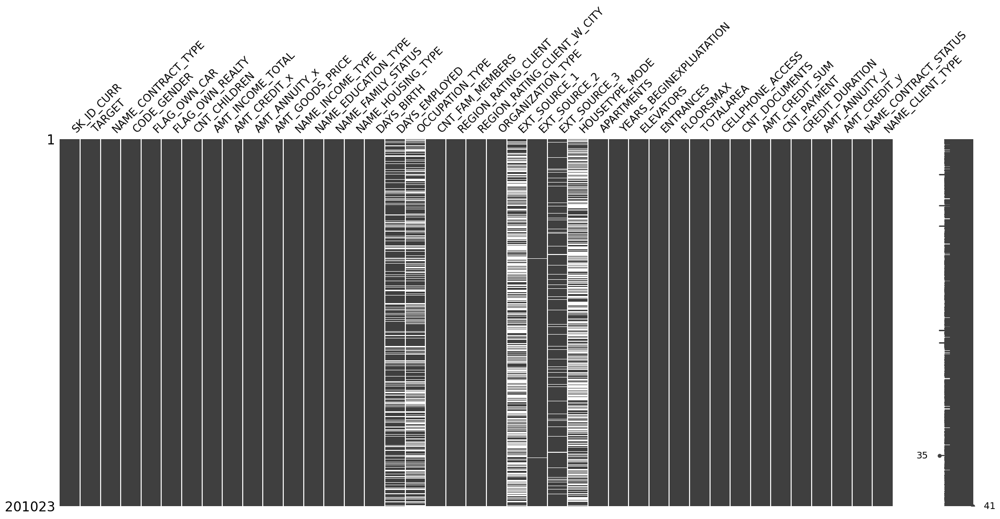

In [4]:
msno.matrix(data)

<AxesSubplot:>

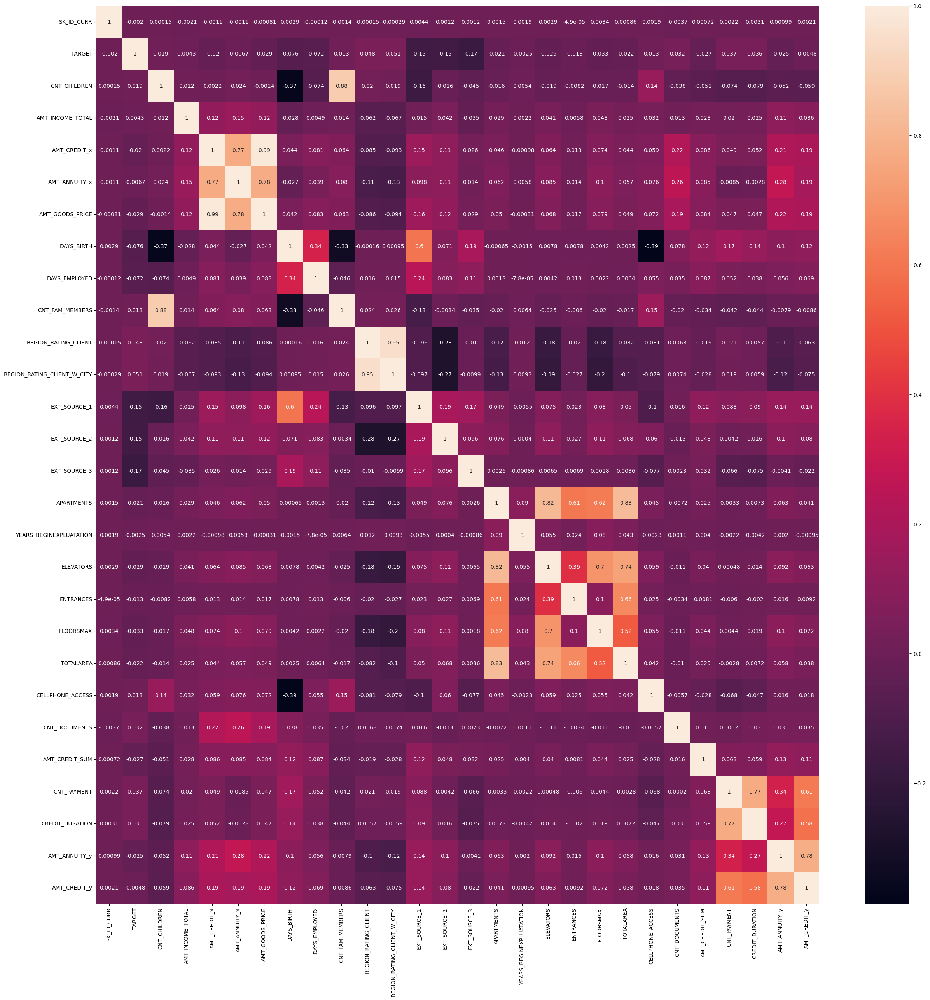

In [5]:
plt.figure(figsize=(30, 30))
sns.heatmap(data.corr(), annot=True)

<Figure size 1200x800 with 0 Axes>

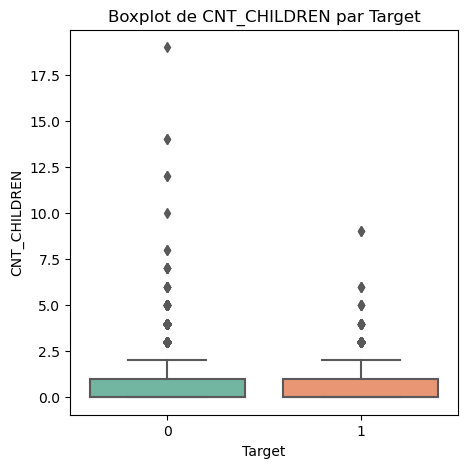

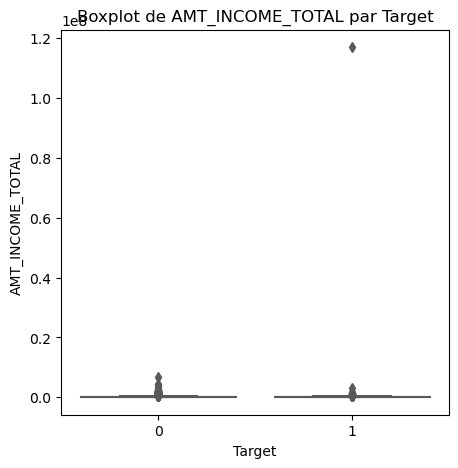

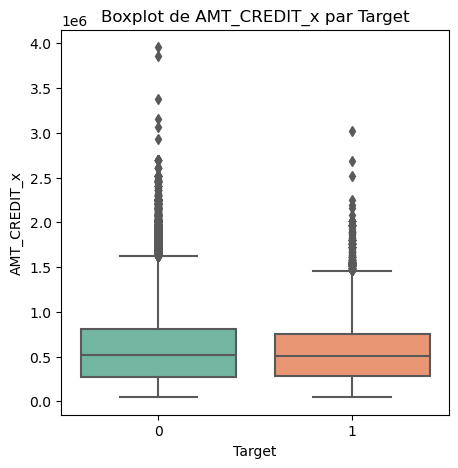

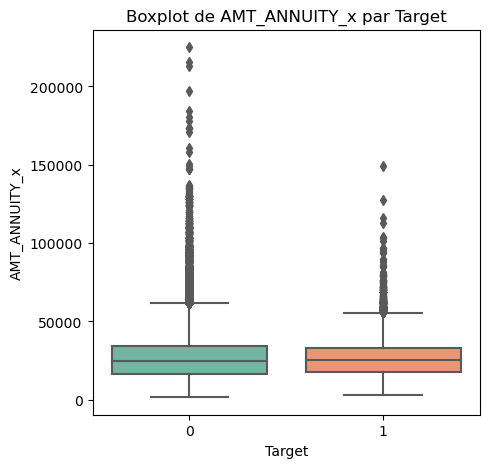

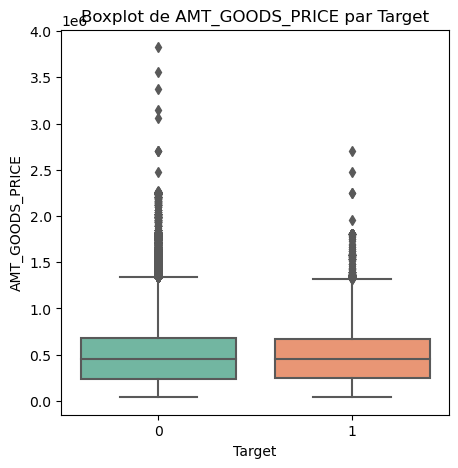

...

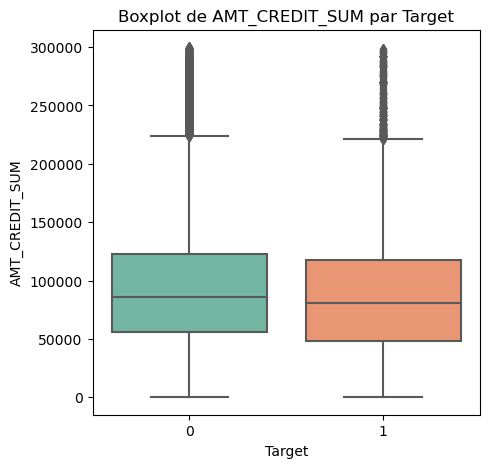

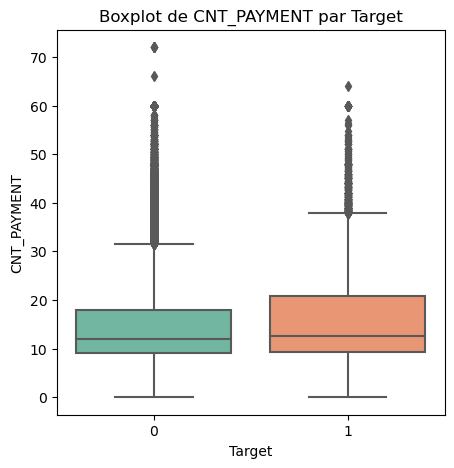

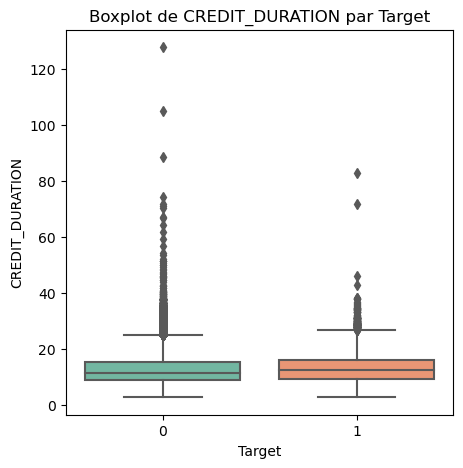

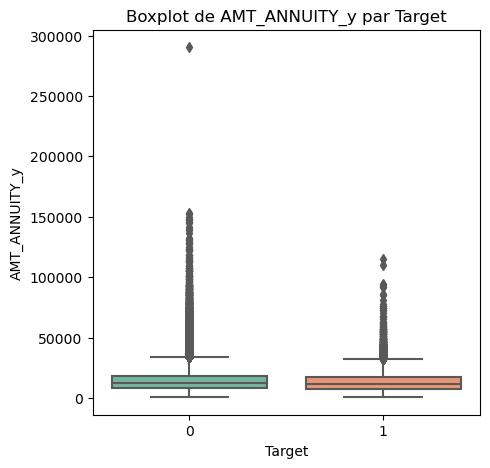

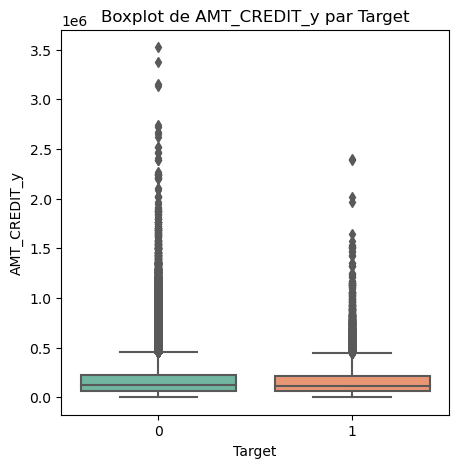

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Liste des colonnes numériques dans vos données
numeric_cols = ['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT_x',
 'AMT_ANNUITY_x',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS',
 'YEARS_BEGINEXPLUATATION',
 'ELEVATORS',
 'ENTRANCES',
 'FLOORSMAX',
 'TOTALAREA',
 'CELLPHONE_ACCESS',
 'CNT_DOCUMENTS',
 'AMT_CREDIT_SUM',
 'CNT_PAYMENT',
 'CREDIT_DURATION',
 'AMT_ANNUITY_y',
 'AMT_CREDIT_y']
# Définir la taille de la figure
plt.figure(figsize=(12, 8))

# Parcourir chaque colonne numérique et tracer un boxplot
for col in numeric_cols:
    plt.figure(figsize=(5,5))
    sns.boxplot(x='TARGET', y=col, data=data, palette='Set2')
    plt.title(f'Boxplot de {col} par Target')
    plt.xlabel('Target')
    plt.ylabel(col)
    plt.show()


#### Compte tenu de l'importance de certainezs features sur la target, et, au vu de leur nombre important de données manquantes il incombe de faire une imputations specifique, notamment pour EXT_SOURCE_1 2 et 3 et days_employed et verification du du mode pour les variables categorielles occ type house mode

In [7]:
data_0 = data[data['TARGET']==0]
data_1 = data[data['TARGET']==1]

# valeurs d'imputations pour la class 0 et 1 des exteranl sources
print(data['EXT_SOURCE_1'].median())
print(data_0['EXT_SOURCE_1'].median())
print(data_1['EXT_SOURCE_1'].median())
print(data['EXT_SOURCE_2'].median())
print(data_0['EXT_SOURCE_2'].median())
print(data_1['EXT_SOURCE_2'].median())
print(data['EXT_SOURCE_3'].median())
print(data_0['EXT_SOURCE_3'].median())
print(data_1['EXT_SOURCE_3'].median())
print(data['DAYS_EMPLOYED'].median())
print(data_0['DAYS_EMPLOYED'].median())
print(data_1['DAYS_EMPLOYED'].median())

# donnée categorielles
print(data_0['OCCUPATION_TYPE'].mode())

0.5192678284760545
0.5294506710820102
0.3806574740846509
0.5685058739405857
0.5752677231815019
0.4497779666513706
0.5460231970049609
0.5549467685334323
0.3962195720630885
4.93972602739726
5.065753424657534
3.731506849315069
0    Laborers
Name: OCCUPATION_TYPE, dtype: object


In [8]:
# px.histogram(data,x='OCCUPATION_TYPE',color='TARGET',barmode='group')
# ce qui justifie l'imputation des nan dans occupation_type

In [9]:
# Imputer les valeurs manquantes dans les colonnes EXT_SOURCE_1, EXT_SOURCE_2 et EXT_SOURCE_3
data.loc[data['TARGET'] == 0, 'EXT_SOURCE_1'] = data.loc[data['TARGET'] == 0, 'EXT_SOURCE_1'].fillna(0.5294506710820102)
data.loc[data['TARGET'] == 1, 'EXT_SOURCE_1'] = data.loc[data['TARGET'] == 1, 'EXT_SOURCE_1'].fillna(0.3806574740846509)

data.loc[data['TARGET'] == 0, 'EXT_SOURCE_2'] = data.loc[data['TARGET'] == 0, 'EXT_SOURCE_2'].fillna(0.5752677231815019)
data.loc[data['TARGET'] == 1, 'EXT_SOURCE_2'] = data.loc[data['TARGET'] == 1, 'EXT_SOURCE_2'].fillna(0.4497779666513706)

data.loc[data['TARGET'] == 0, 'EXT_SOURCE_3'] = data.loc[data['TARGET'] == 0, 'EXT_SOURCE_3'].fillna(0.5549467685334323)
data.loc[data['TARGET'] == 1, 'EXT_SOURCE_3'] = data.loc[data['TARGET'] == 1, 'EXT_SOURCE_3'].fillna(0.3962195720630885)


data.loc[data['TARGET'] == 0, 'DAYS_EMPLOYED'] = data.loc[data['TARGET'] == 0, 'DAYS_EMPLOYED'].fillna(5.065753424657534)
data.loc[data['TARGET'] == 1, 'DAYS_EMPLOYED'] = data.loc[data['TARGET'] == 1, 'DAYS_EMPLOYED'].fillna(3.731506849315069)

data.loc[data['TARGET'] == 0, 'OCCUPATION_TYPE'] = data.loc[data['TARGET'] == 0, 'OCCUPATION_TYPE'].fillna('Laborers')
data.loc[data['TARGET'] == 1, 'OCCUPATION_TYPE'] = data.loc[data['TARGET'] == 1, 'OCCUPATION_TYPE'].fillna('Laborers')

#### taux d'occupation d'un individu (annee travailles par age)

In [10]:
data['OCCUPATION_RATE'] = data['DAYS_EMPLOYED']/data['DAYS_BIRTH']

In [11]:
data['RATING_CLIENT_REGION'] = (data['REGION_RATING_CLIENT']+data['REGION_RATING_CLIENT_W_CITY'])/2

In [12]:
# px.histogram(data,x=['REGION_RATING_CLIENT'],color='TARGET', barmode='group')
# px.histogram(data,x=['REGION_RATING_CLIENT_W_CITY'],color='TARGET', barmode='group')

# tres formtement correlés et les graph se resemblent beaucoup

In [13]:
# px.histogram(data,x='HOUSETYPE_MODE',color='TARGET',barmode='group')
# quasi qu'une class avec les meme proportion et aucun incidence sur la target
# ce qui me permet de justifier la sippression d'une colonne

In [14]:
cols_to_drop = ['REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY','HOUSETYPE_MODE']

data.drop(cols_to_drop,axis=1,inplace=True)

<AxesSubplot:>

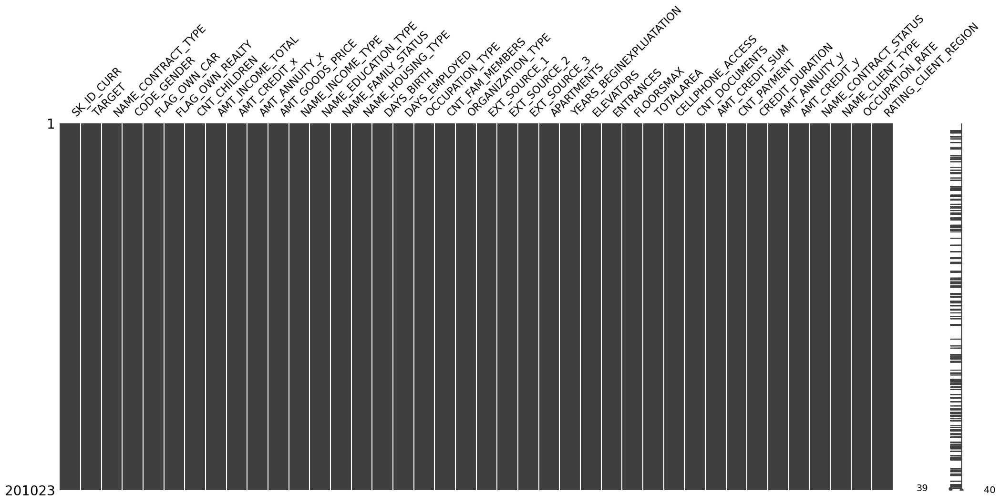

In [15]:
msno.matrix(data)

<AxesSubplot:>

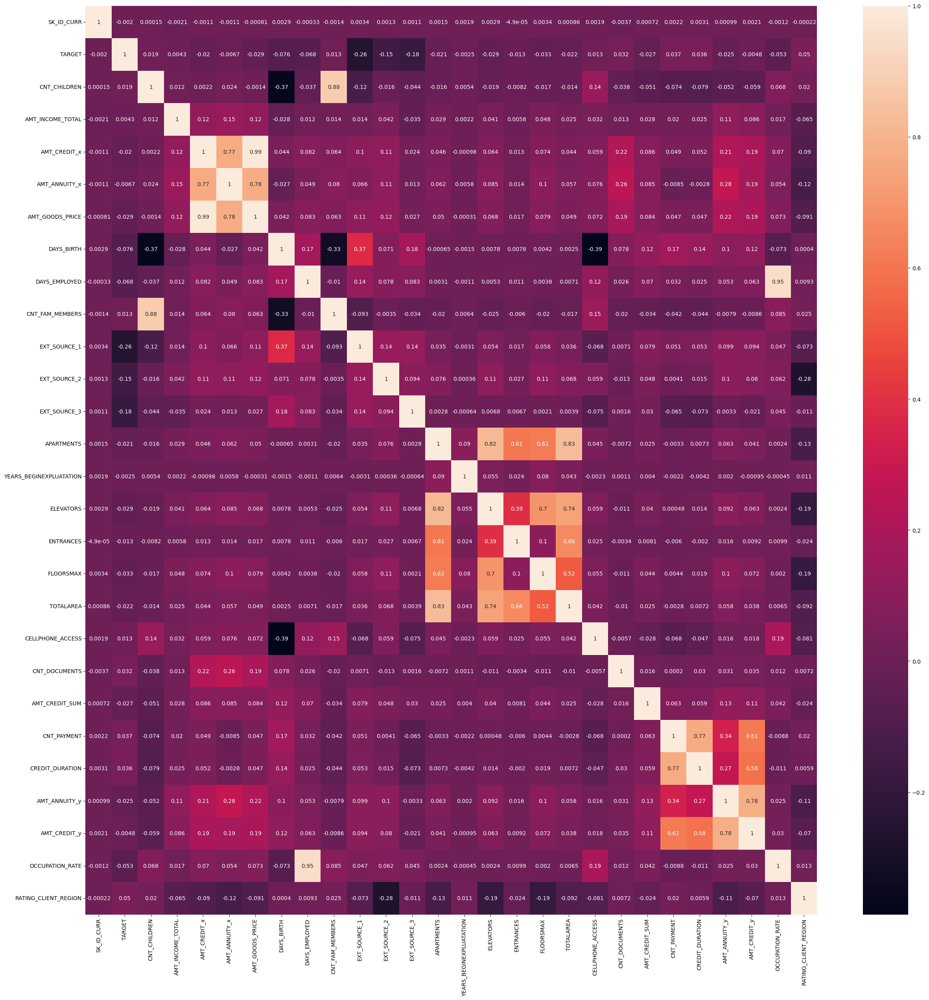

In [16]:
plt.figure(figsize=(30, 30))
sns.heatmap(data.corr(), annot=True)

#### occupons nous des outliers

In [17]:
num = data.select_dtypes(exclude='object')
list(num.columns)

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT_x',
 'AMT_ANNUITY_x',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS',
 'YEARS_BEGINEXPLUATATION',
 'ELEVATORS',
 'ENTRANCES',
 'FLOORSMAX',
 'TOTALAREA',
 'CELLPHONE_ACCESS',
 'CNT_DOCUMENTS',
 'AMT_CREDIT_SUM',
 'CNT_PAYMENT',
 'CREDIT_DURATION',
 'AMT_ANNUITY_y',
 'AMT_CREDIT_y',
 'OCCUPATION_RATE',
 'RATING_CLIENT_REGION']

In [18]:
print('nb outlier colonne : CNT_CHILDREN ',(data['CNT_CHILDREN']>7).sum())
print('nb outlier colonne : AMT_INCOME_TOTAL ',(data['AMT_INCOME_TOTAL']>1000000).sum())
print('nb outlier colonne : AMT_ANNUITY_x ',(data['AMT_ANNUITY_x']>150000).sum())
print('nb outlier colonne : AMT_CREDIT_x ',(data['AMT_CREDIT_x']>3000000).sum())
print('nb outlier colonne : AMT_GOODS_PRICE ',(data['AMT_GOODS_PRICE']>2500000).sum())
print('nb outlier colonne : CNT_FAM_MEMBERS ',(data['CNT_FAM_MEMBERS']>=15).sum())
print('nb outlier colonne : APARTMENTS ',(data['APARTMENTS']>=1).sum())
print('nb outlier colonne : YEARS_BEGINEXPLUATATION ',(data['YEARS_BEGINEXPLUATATION']<0.7).sum())
print('nb outlier colonne : ELEVATORS ',(data['ELEVATORS']>0.8).sum())
print('nb outlier colonne : ENTRANCES ',(data['ENTRANCES']>0.8).sum())
print('nb outlier colonne : FLOORSMAX ',(data['FLOORSMAX']>0.8).sum())
print('nb outlier colonne : TOTALAREA',(data['TOTALAREA']>3).sum())
print('nb outlier colonne : CNT_PAYMENT',(data['CNT_PAYMENT']>60).sum())
print('nb outlier colonne : CREDIT_DURATION',(data['CREDIT_DURATION']>80).sum())
print('nb outlier colonne : AMT_ANNUITY_y',(data['AMT_ANNUITY_y']>150000).sum())
print('nb outlier colonne : AMT_CREDIT_y',(data['AMT_CREDIT_y']>2000000).sum())

nb outlier colonne : CNT_CHILDREN  10
nb outlier colonne : AMT_INCOME_TOTAL  112
nb outlier colonne : AMT_ANNUITY_x  14
nb outlier colonne : AMT_CREDIT_x  6
nb outlier colonne : AMT_GOODS_PRICE  9
nb outlier colonne : CNT_FAM_MEMBERS  3
nb outlier colonne : APARTMENTS  78
nb outlier colonne : YEARS_BEGINEXPLUATATION  438
nb outlier colonne : ELEVATORS  273
nb outlier colonne : ENTRANCES  192
nb outlier colonne : FLOORSMAX  284
nb outlier colonne : TOTALAREA 7
nb outlier colonne : CNT_PAYMENT 7
nb outlier colonne : CREDIT_DURATION 5
nb outlier colonne : AMT_ANNUITY_y 3
nb outlier colonne : AMT_CREDIT_y 34


In [19]:
# data avant traitement des outliers
data.shape

(201023, 40)

In [20]:
data.drop(data[data['CNT_CHILDREN']>7].index,inplace=True)
data.drop(data[data['AMT_INCOME_TOTAL']>1000000].index,inplace=True)
data.drop(data[data['AMT_ANNUITY_x']>150000].index,inplace=True)
data.drop(data[data['AMT_CREDIT_x']>3000000].index,inplace=True)
data.drop(data[data['AMT_GOODS_PRICE']>2500000].index,inplace=True)
data.drop(data[data['CNT_FAM_MEMBERS']>=15].index,inplace=True)
data.drop(data[data['APARTMENTS']>=1].index,inplace=True)
data.drop(data[data['YEARS_BEGINEXPLUATATION']<0.7].index,inplace=True)
data.drop(data[data['ELEVATORS']>0.8].index,inplace=True)
data.drop(data[data['ENTRANCES']>0.8].index,inplace=True)
data.drop(data[data['FLOORSMAX']>0.8].index,inplace=True)
data.drop(data[data['TOTALAREA']>3].index,inplace=True)
data.drop(data[data['CNT_PAYMENT']>60].index,inplace=True)
data.drop(data[data['CREDIT_DURATION']>80].index,inplace=True)
data.drop(data[data['AMT_ANNUITY_y']>150000].index,inplace=True)
data.drop(data[data['AMT_CREDIT_y']>2000000].index,inplace=True)

In [21]:
# data après traitement des outliers
data.shape

(199679, 40)

<AxesSubplot:>

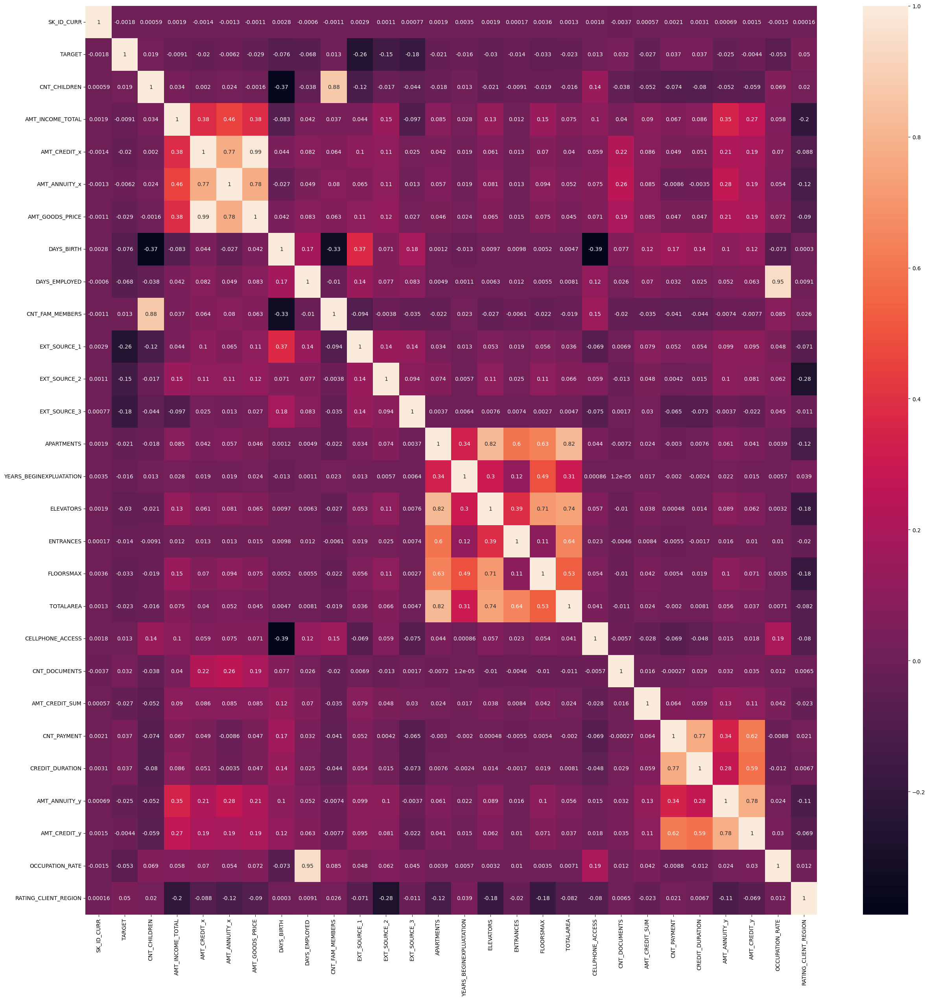

In [22]:
plt.figure(figsize=(30, 30))
sns.heatmap(data.corr(), annot=True)

In [23]:
data['MONOPARENTAL'] = data['CNT_FAM_MEMBERS'] - data['CNT_CHILDREN'] 

In [24]:
data.ORGANIZATION_TYPE.unique()

array(['Business Entity Type 3', 'School', 'Government', 'Religion',
       'Other', 'XNA', 'Medicine', 'Business Entity Type 2',
       'Self-employed', 'Kindergarten', 'Transport: type 4',
       'Industry: type 1', 'Emergency', 'Security', 'Industry: type 11',
       'Police', 'Construction', 'Postal', 'Industry: type 4',
       'Restaurant', 'Transport: type 2', 'Culture', 'Hotel',
       'Industry: type 7', 'Industry: type 3', 'Trade: type 2', 'Housing',
       'Bank', 'Military', 'Trade: type 3', 'Industry: type 9',
       'Business Entity Type 1', 'Services', 'Trade: type 6',
       'Industry: type 2', 'Trade: type 7', 'Transport: type 3',
       'Transport: type 1', 'Agriculture', 'Industry: type 12',
       'Security Ministries', 'Insurance', 'Mobile', 'Trade: type 1',
       'Electricity', 'Industry: type 5', 'Legal Services', 'Advertising',
       'University', 'Trade: type 5', 'Industry: type 13',
       'Industry: type 8', 'Realtor', 'Telecom', 'Cleaning',
       'Industry

In [25]:
data.shape

(199679, 41)

In [26]:
# Regrouper les catégories similaires et supprimer 'XNA'
data['ORGANIZATION_TYPE'] = data['ORGANIZATION_TYPE'].replace({
    'Industry: type 10': 'Industry','Industry: type 6': 'Industry','Industry: type 13': 'Industry','Industry: type 8': 'Industry',
    'Electricity': 'Industry','Industry: type 5': 'Industry','Industry: type 12': 'Industry','Industry: type 2': 'Industry','Industry: type 9': 'Industry',
    'Industry: type 3': 'Industry','Industry: type 7': 'Industry','Industry: type 4': 'Industry','Industry: type 11': 'Industry', 'Construction': 'Industry',
    'Industry: type 1': 'Industry', 
    
    'Trade: type 1': 'Trade', 
    'Trade: type 2': 'Trade', 
    'Trade: type 3': 'Trade', 
    'Trade: type 4': 'Trade', 
    'Trade: type 5': 'Trade', 
    'Trade: type 6': 'Trade', 
    'Trade: type 7': 'Trade',  
    
    'Business Entity Type 1': 'Business',
    'Business Entity Type 2': 'Business',
    'Business Entity Type 3': 'Business',
    'Business Entity Type 4': 'Business',
    
    
    'Transport: type 1': 'Transport',
    'Transport: type 2': 'Transport',
    'Transport: type 3': 'Transport',
    'Transport: type 4': 'Transport',
    
    'XNA': None,
    'Police': 'Security',
    'Military': 'Security',
    'Security Ministries': 'Security',
    
    'Hotel': 'Hotel',
    'Housing': 'Hotel',
    
    'Bank': 'Financial',
    'Insurance': 'Financial',
    
    'University': 'Education',
    'School': 'Education',
    
    'Advertising': 'Telecom',
    'Telecom': 'Telecom',
    'Mobile' : 'Telecom',
    
    "Medicine" : 'Care',
    'Emergency' : 'Care',
    
    'Kindergarten':'Services',
    'Cleaning':'Services',
    'Restaurant':'Services',
    'Culture':'Services',
    'Services':'Services',
    'Realtor':'Services',
    
    'Other' : 'Other',
    'Self-employed':'Other',    
    'Religion'  :'Other',
    'Postal' :'Other',
    'Legal Services':'Other',
    
    
    'Agriculture':'Agriculture'    
 
    
})

# Supprimer les lignes contenant des valeurs nulles après le remplacement de 'XNA'
# data.dropna(subset=['ORGANIZATION_TYPE'], inplace=True)
data['OCCUPATION_TYPE'] = data['OCCUPATION_TYPE'].fillna('Other')
# Afficher les catégories uniques après le regroupement
print("\nCatégories uniques après le regroupement :\n", data['ORGANIZATION_TYPE'].unique())



Catégories uniques après le regroupement :
 ['Business' 'Education' 'Government' 'Other' None 'Care' 'Services'
 'Transport' 'Industry' 'Security' 'Hotel' 'Trade' 'Financial'
 'Agriculture' 'Telecom']


In [27]:
data.shape

(199679, 41)

# preprocessing

In [28]:
from sklearn.preprocessing import LabelEncoder

In [29]:
# changement de type 
# encodage label pour les categories binaires
# one hot pour les autre
# standard scaler pour les données numériques

In [30]:
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,AMT_CREDIT_SUM,CNT_PAYMENT,CREDIT_DURATION,AMT_ANNUITY_y,AMT_CREDIT_y,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE,OCCUPATION_RATE,RATING_CLIENT_REGION,MONOPARENTAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,59293.652143,24.000000,19.353584,9251.775000,179055.00,Approved,New,0.067329,2.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,69133.500000,10.000000,8.677472,56553.990000,484191.00,Approved,Refreshed,0.070862,1.0,2.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,94518.900000,4.000000,3.753045,5357.250000,20106.00,Approved,New,0.011814,2.0,1.0
3,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,146250.000000,20.666667,12.644075,12278.805000,166638.75,Approved,Repeater,0.152418,2.0,1.0
4,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,...,100419.750000,14.000000,10.726940,15839.696250,162767.70,Approved,Repeater,0.093737,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201018,456246,0,Cash loans,F,N,Y,1,94500.0,225000.0,10620.0,...,127500.000000,3.000000,12.452183,6748.830000,84046.50,Approved,New,0.543859,2.0,2.0
201019,456247,0,Cash loans,F,N,Y,0,112500.0,345510.0,17770.5,...,119224.800000,7.750000,6.369956,10466.921250,59184.00,Approved,Repeater,0.033614,2.0,1.0
201020,456249,0,Cash loans,F,N,Y,0,112500.0,225000.0,22050.0,...,141979.808571,12.000000,9.671877,17133.952500,158699.25,Refused,Repeater,0.075828,2.0,1.0
201021,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,45000.000000,15.000000,11.160244,10681.132500,134439.75,Approved,Repeater,0.400134,2.0,2.0


In [31]:
# Récupérer les colonnes avec exactement deux classes distinctes
colonnes_2_classes = [colonne for colonne in data.columns if data[colonne].nunique() == 2]

# Afficher les colonnes avec exactement deux classes distinctes
print("\nColonnes avec exactement deux classes distinctes :\n", colonnes_2_classes)


Colonnes avec exactement deux classes distinctes :
 ['TARGET', 'NAME_CONTRACT_TYPE', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_DOCUMENTS', 'MONOPARENTAL']


In [32]:
data['CNT_DOCUMENTS'] = data['CNT_DOCUMENTS'].astype('object')

In [33]:
# Initialiser LabelEncoder
label_encoder = LabelEncoder()

# Encoder les colonnes catégorielles avec deux classes
for colonne in data.columns:
    if data[colonne].dtype == 'object' and data[colonne].nunique() == 2:
        data[colonne] = label_encoder.fit_transform(data[colonne])

# Créer des variables indicatrices pour les colonnes catégorielles avec plus de deux classes
df = pd.get_dummies(data)

# Afficher le DataFrame avec les colonnes encodées
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE,...,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade,ORGANIZATION_TYPE_Transport,NAME_CONTRACT_STATUS_Approved,NAME_CONTRACT_STATUS_Canceled,NAME_CONTRACT_STATUS_Refused,NAME_CLIENT_TYPE_New,NAME_CLIENT_TYPE_Refreshed,NAME_CLIENT_TYPE_Repeater
0,100002,1,0,0,1,0,202500.0,406597.5,24700.5,351000.0,...,0,0,0,0,1,0,0,1,0,0
1,100003,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,...,0,0,0,0,1,0,0,0,1,0
2,100004,0,1,1,1,0,67500.0,135000.0,6750.0,135000.0,...,0,0,0,0,1,0,0,1,0,0
3,100007,0,0,0,1,0,121500.0,513000.0,21865.5,513000.0,...,0,0,0,0,1,0,0,0,0,1
4,100008,0,0,0,1,0,99000.0,490495.5,27517.5,454500.0,...,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201018,456246,0,0,0,1,1,94500.0,225000.0,10620.0,225000.0,...,0,0,0,0,1,0,0,1,0,0
201019,456247,0,0,0,1,0,112500.0,345510.0,17770.5,247500.0,...,0,0,0,0,1,0,0,0,0,1
201020,456249,0,0,0,1,0,112500.0,225000.0,22050.0,225000.0,...,0,0,0,0,0,0,1,0,0,1
201021,456254,1,0,0,1,0,171000.0,370107.0,20205.0,319500.0,...,0,0,0,0,1,0,0,0,0,1


In [34]:
df.drop('SK_ID_CURR',axis=1,inplace=True)

In [35]:
# Sélectionner les fonctionnalités numériques
numeric_features = df.select_dtypes(exclude=['object'])

# Initialiser RobustScaler
scaler = RobustScaler()

# Adapter et transformer les données numériques
scaled_features = scaler.fit_transform(numeric_features)

# Remplacer les valeurs numériques d'origine par les valeurs mises à l'échelle dans le dataframe
df[numeric_features.columns] = scaled_features


In [36]:
df = df.dropna()

<AxesSubplot:>

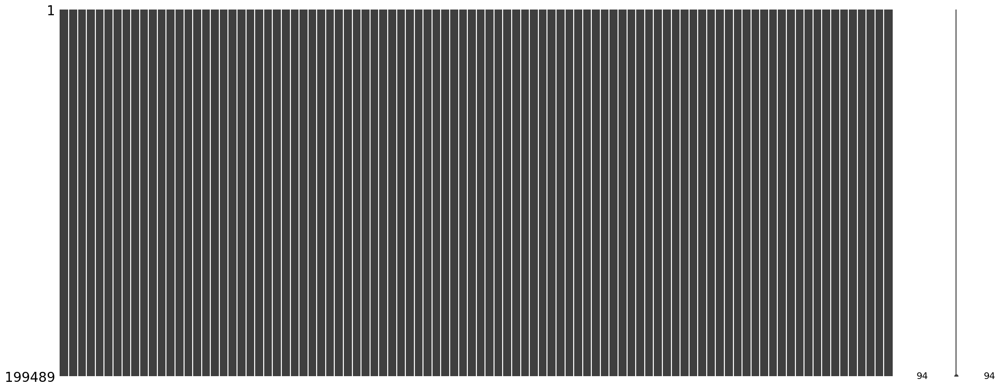

In [37]:
msno.matrix(df)

In [38]:
# df.to_csv('cleanedData/df.csv')

In [39]:
X = df.drop('TARGET', axis=1)
y = df['TARGET']

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)

In [41]:
ckf = StratifiedKFold(n_splits=10, random_state=1, shuffle=True)

In [42]:
rus = RandomUnderSampler(random_state=42)
X_res, y_res = rus.fit_resample(X_train, y_train)
print(X_res.shape,y_res.shape)

(23900, 93) (23900,)


In [43]:
model = LogisticRegression(max_iter=1000)

In [44]:
model.fit(X_res,y_res)

LogisticRegression(max_iter=1000)

In [45]:
y_pred = model.predict(X_test)

In [46]:
# Afficher le rapport de classification
print(classification_report(y_test, y_pred))
plot_matrix(y_test, y_pred)

              precision    recall  f1-score   support

         0.0       0.98      0.78      0.87     36910
         1.0       0.22      0.78      0.34      2988

    accuracy                           0.78     39898
   macro avg       0.60      0.78      0.61     39898
weighted avg       0.92      0.78      0.83     39898

[[28744  8166]
 [  665  2323]]


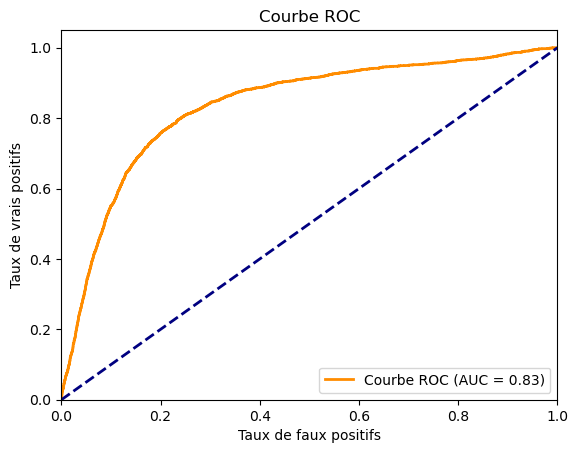

In [47]:
plot_roc_auc(model,X_test,y_test)

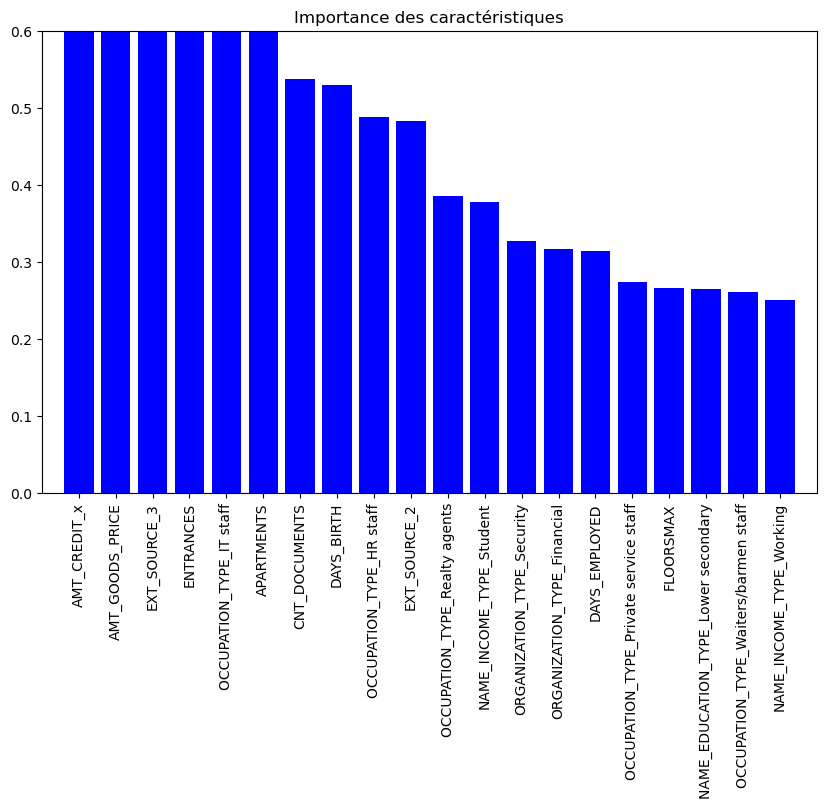

In [48]:
plot_features_importance_10(model, X_res, top_n=20)

In [64]:
from lightgbm import LGBMClassifier
# Créer le modèle XGBoost
model = LGBMClassifier()

# Entraîner le modèle sur les données équilibrées
model.fit(X_res, y_res)

# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 11950, number of negative: 11950
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train set: 23900, number of used features: 89
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


In [65]:
# Afficher le rapport de classification
print(classification_report(y_test, y_pred))
plot_matrix(y_test, y_pred)

              precision    recall  f1-score   support

         0.0       0.99      0.88      0.93     36910
         1.0       0.37      0.88      0.52      2988

    accuracy                           0.88     39898
   macro avg       0.68      0.88      0.72     39898
weighted avg       0.94      0.88      0.90     39898

[[32363  4547]
 [  362  2626]]


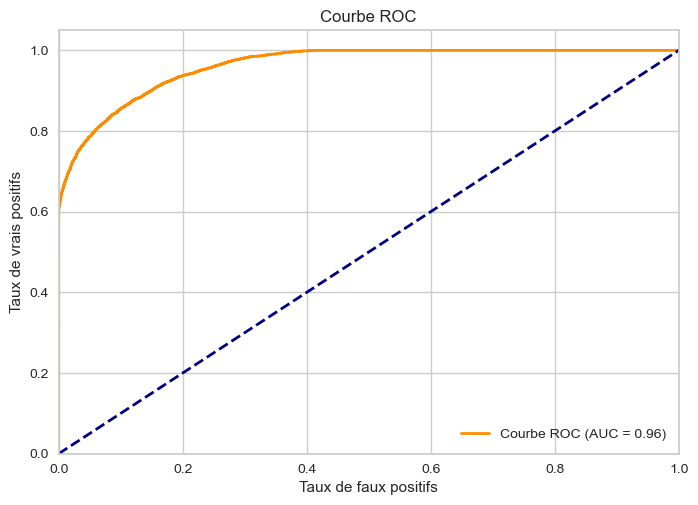

In [66]:
plot_roc_auc(model,X_test,y_test)

In [49]:
# Créer le modèle XGBoost
model = xgb.XGBClassifier()

# Entraîner le modèle sur les données équilibrées
model.fit(X_res, y_res)

# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

In [50]:
# Afficher le rapport de classification
print(classification_report(y_test, y_pred))
plot_matrix(y_test, y_pred)

              precision    recall  f1-score   support

         0.0       0.99      0.87      0.93     36910
         1.0       0.35      0.87      0.50      2988

    accuracy                           0.87     39898
   macro avg       0.67      0.87      0.72     39898
weighted avg       0.94      0.87      0.89     39898

[[32153  4757]
 [  374  2614]]


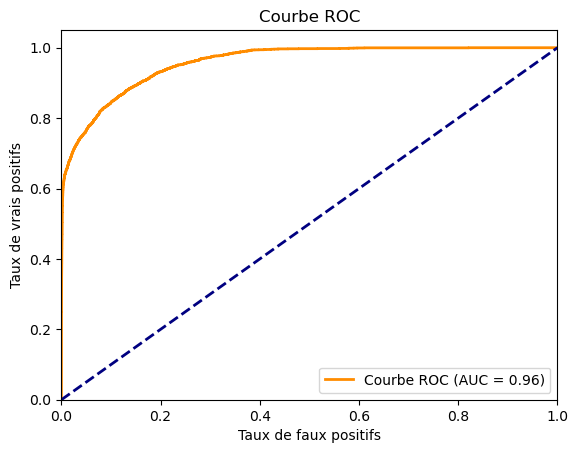

In [51]:
plot_roc_auc(model,X_test,y_test)

In [52]:
scores = cross_val_score(model,X_res,y_res,scoring='accuracy',cv=ckf, n_jobs=-1)
print(scores)

[0.87280335 0.88075314 0.87196653 0.87322176 0.87405858 0.87405858
 0.88033473 0.86317992 0.8832636  0.86694561]


### differentes techniques de sampling

In [53]:
from imblearn.combine import SMOTEENN, SMOTETomek
from imblearn.over_sampling import ADASYN, SMOTE
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.metrics import classification_report
from xgboost import XGBClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split



# Définition des méthodes de rééchantillonnage
resampling_methods = {
    'SMOTE': SMOTE(random_state=42),
    'ADASYN': ADASYN(random_state=42),
    'SMOTEENN': SMOTEENN(random_state=42),
    'SMOTETomek': SMOTETomek(random_state=42),
    #'BalanceCascade': BalancedBaggingClassifier(n_estimators=10, sampling_strategy='auto', replacement=False, random_state=42)
}

# Boucle sur chaque méthode de rééchantillonnage
for method_name, resampler in resampling_methods.items():
    # Rééchantillonnage des données
    X_resampled, y_resampled = resampler.fit_resample(X_train, y_train)

    # Entraînement du modèle XGBoost
    xgb_clf = XGBClassifier(random_state=42)
    xgb_clf.fit(X_resampled, y_resampled)

    # Prédiction sur l'ensemble de test
    y_pred = xgb_clf.predict(X_test)

    # Calcul du rapport de classification
    report = classification_report(y_test, y_pred)

    # Affichage du rapport pour chaque méthode
    print(f"Classification report for {method_name}:\n{report}\n{'='*50}")
    plot_matrix(y_test, y_pred)

Classification report for SMOTE:
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     36910
         1.0       0.94      0.64      0.76      2988

    accuracy                           0.97     39898
   macro avg       0.96      0.82      0.87     39898
weighted avg       0.97      0.97      0.97     39898

[[36794   116]
 [ 1071  1917]]
Classification report for ADASYN:
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98     36910
         1.0       0.94      0.64      0.76      2988

    accuracy                           0.97     39898
   macro avg       0.95      0.82      0.87     39898
weighted avg       0.97      0.97      0.97     39898

[[36779   131]
 [ 1090  1898]]
Classification report for SMOTEENN:
              precision    recall  f1-score   support

         0.0       0.98      0.93      0.95     36910
         1.0       0.47      0.80      0.59      2988

    accuracy     

In [68]:
#!pip install explainerdashboard

     -------------------------------------- 287.8/287.8 kB 4.5 MB/s eta 0:00:00
     ---------------------------------------- 56.7/56.7 kB ? eta 0:00:00
     ---------------------------------------- 91.8/91.8 kB 5.1 MB/s eta 0:00:00
     ---------------------------------------- 47.1/47.1 kB 2.3 MB/s eta 0:00:00
     -------------------------------------- 453.1/453.1 kB 5.7 MB/s eta 0:00:00
     -------------------------------------- 222.5/222.5 kB 4.5 MB/s eta 0:00:00
     -------------------------------------- 146.0/146.0 kB 4.4 MB/s eta 0:00:00


In [82]:
from explainerdashboard import ClassifierExplainer, ExplainerDashboard
explainer = ClassifierExplainer(model, X_test, y_test)

Note: model_output=='probability'. For LGBMClassifier shap values normally get calculated against X_background, but paramater X_background=None, so using X instead
Generating self.shap_explainer = shap.TreeExplainer(model, X, model_output='probability', feature_perturbation='interventional')...
Note: Shap interaction values will not be available. If shap values in probability space are not necessary you can pass model_output='logodds' to get shap values in logodds without the need for a background dataset and also working shap interaction values...


In [83]:
ExplainerDashboard(explainer).run()

Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...
Calculating shap values...


 99%|===================| 39611/39898 [01:32<00:00]        

Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Calculating dependencies...
Calculating permutation importances (if slow, try setting n_jobs parameter)...
Calculating pred_percentiles...
Calculating predictions...
Reminder: you can store the explainer (including calculated dependencies) with explainer.dump('explainer.joblib') and reload with e.g. ClassifierExplainer.from_file('explainer.joblib')
Registering callbacks...
Starting ExplainerDashboard on http://192.168.1.98:8050


ConnectionError: HTTPConnectionPool(host='0.0.0.0', port=8050): Max retries exceeded with url: /_alive_350c6e9a-27aa-4cbb-b1fa-fbc51a31bc7d (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x000002850436C400>: Failed to establish a new connection: [WinError 10049] L’adresse demandée n’est pas valide dans son contexte'))

Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty DataFrame
Columns: [col, contribution, value]
Index: []
Empty Da

# faire un clustering de la classe majoritaire

#### recupérer a partir du jeu de donnée préparé que les target = 0

In [54]:
data_cluster = df[df['TARGET']==0]

In [55]:
# visualiser de façon globale les données
# sns.pairplot(data_cluster)

In [56]:
data_cluster

,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE,DAYS_BIRTH,...,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade,ORGANIZATION_TYPE_Transport,NAME_CONTRACT_STATUS_Approved,NAME_CONTRACT_STATUS_Canceled,NAME_CONTRACT_STATUS_Refused,NAME_CLIENT_TYPE_New,NAME_CLIENT_TYPE_Refreshed,NAME_CLIENT_TYPE_Repeater
1,0.0,0.0,0.0,-1.0,0.0,1.35,1.450025,0.614721,1.540816,0.113498,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
2,0.0,1.0,1.0,0.0,0.0,-0.90,-0.700727,-1.018020,-0.714286,0.435901,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0
3,0.0,0.0,0.0,0.0,0.0,-0.30,0.001028,-0.165482,0.142857,0.561131,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,-0.55,-0.040752,0.153299,0.010204,0.138375,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,-0.40,0.941546,0.509137,1.051020,0.584735,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201017,0.0,0.0,0.0,0.0,0.0,1.25,1.469165,0.630711,1.561224,0.625866,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
201018,0.0,0.0,0.0,0.0,1.0,-0.60,-0.533642,-0.799746,-0.510204,0.014276,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0
201019,0.0,0.0,0.0,0.0,0.0,-0.40,-0.309916,-0.396447,-0.459184,-0.578375,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
201020,0.0,0.0,0.0,0.0,0.0,-0.40,-0.533642,-0.155076,-0.510204,1.190389,...,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0


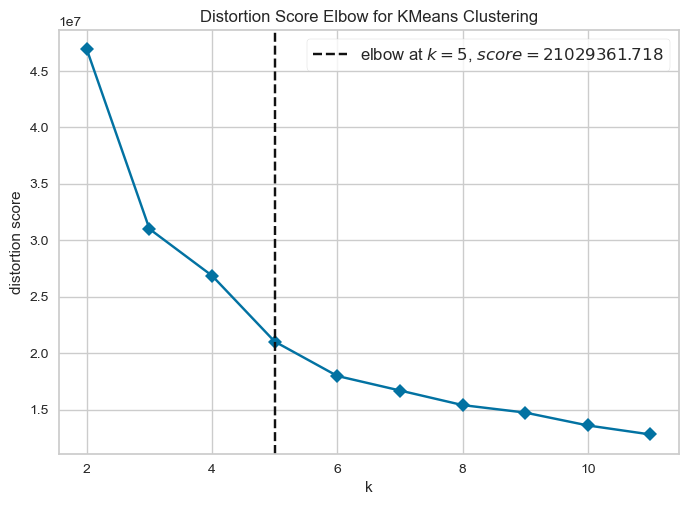

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [57]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

# Créer une instance de KMeans
kmeans = KMeans(random_state=42)

# Utiliser la méthode du coude pour trouver le nombre optimal de clusters
visualizer = KElbowVisualizer(kmeans, k=(2, 12), metric='distortion', timings=False)

# Ajouter l'inertie comme métrique supplémentaire
visualizer.fit(data_cluster)  # Assurez-vous de remplacer 'df' par votre DataFrame
visualizer.show()


C:\Users\najibou\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.

C:\Users\najibou\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.

C:\Users\najibou\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.

C:\Users\najibou\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

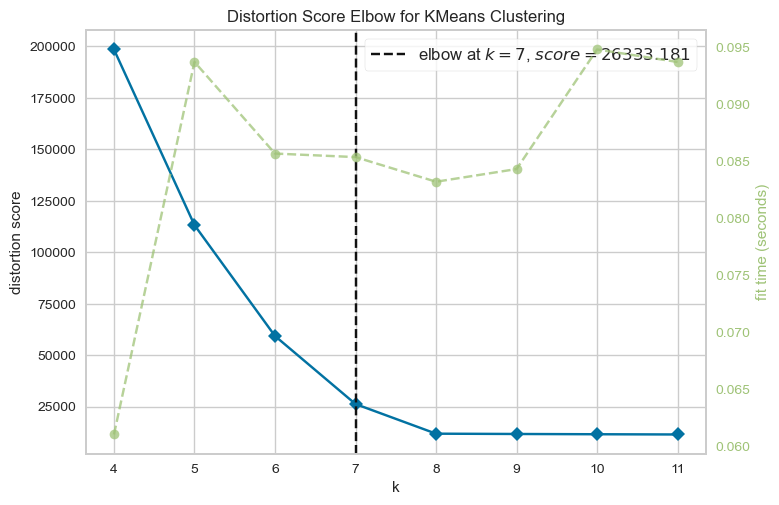

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [58]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from yellowbrick.cluster import KElbowVisualizer

# Generate synthetic dataset with 8 random clusters
X, y = make_blobs(n_samples=1000, n_features=12, centers=8, random_state=42)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(4,12))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

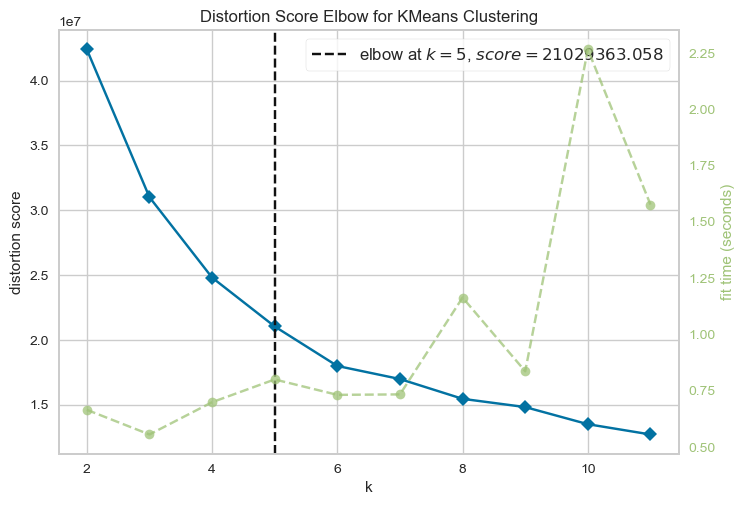

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [59]:
# alban
from yellowbrick.cluster import KElbowVisualizer

model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,12))

visualizer.fit(data_cluster)
visualizer.show()

In [60]:
# Entrainement sans Standardisation

model = KMeans(n_clusters=6, random_state=0)
training = model.fit_predict(data_cluster)
training

array([1, 1, 1, ..., 1, 4, 0])

In [61]:
data_cluster["label"] = model.labels_
data_cluster

C:\Users\najibou\AppData\Local\Temp\ipykernel_11188\4097128999.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,TARGET,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE,DAYS_BIRTH,...,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade,ORGANIZATION_TYPE_Transport,NAME_CONTRACT_STATUS_Approved,NAME_CONTRACT_STATUS_Canceled,NAME_CONTRACT_STATUS_Refused,NAME_CLIENT_TYPE_New,NAME_CLIENT_TYPE_Refreshed,NAME_CLIENT_TYPE_Repeater,label
1,0.0,0.0,0.0,-1.0,0.0,1.35,1.450025,0.614721,1.540816,0.113498,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,1
2,0.0,1.0,1.0,0.0,0.0,-0.90,-0.700727,-1.018020,-0.714286,0.435901,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1
3,0.0,0.0,0.0,0.0,0.0,-0.30,0.001028,-0.165482,0.142857,0.561131,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,0.0,0.0,0.0,0.0,0.0,-0.55,-0.040752,0.153299,0.010204,0.138375,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5,0.0,0.0,0.0,0.0,0.0,-0.40,0.941546,0.509137,1.051020,0.584735,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201017,0.0,0.0,0.0,0.0,0.0,1.25,1.469165,0.630711,1.561224,0.625866,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
201018,0.0,0.0,0.0,0.0,1.0,-0.60,-0.533642,-0.799746,-0.510204,0.014276,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1
201019,0.0,0.0,0.0,0.0,0.0,-0.40,-0.309916,-0.396447,-0.459184,-0.578375,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
201020,0.0,0.0,0.0,0.0,0.0,-0.40,-0.533642,-0.155076,-0.510204,1.190389,...,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,4


In [62]:
from sklearn.metrics import silhouette_score, silhouette_samples

KeyboardInterrupt: 

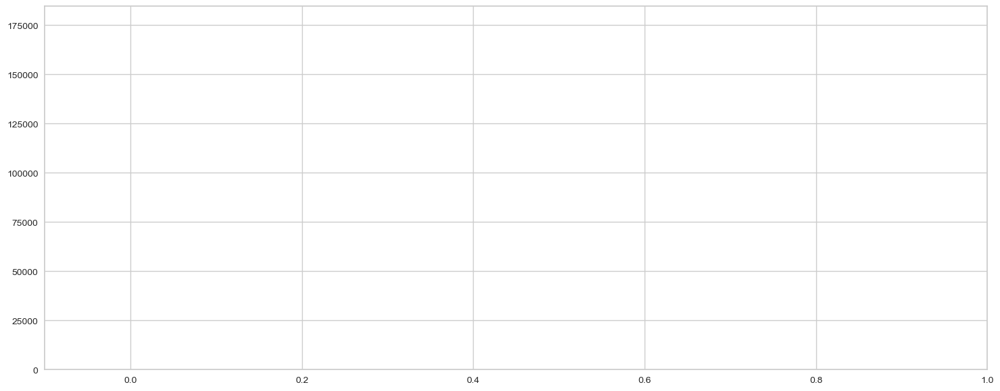

In [67]:
# Déterminer les silouettes

range_n_clusters = [4, 5, 6, 7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1)
    fig.set_size_inches(18, 7)
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_cluster) + (n_clusters + 1) * 10])
    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=0)
    cluster_labels = clusterer.fit_predict(data_cluster)
     # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_cluster, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_cluster, cluster_labels)
    
    y_lower = 8
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 8  # 10 for the 0 samples
        
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])